# Preparations

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf

import os
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
import re
from matplotlib.pyplot import imshow, imread, imsave
import seaborn as sns
from skimage.color import rgb2gray
import geopandas as gpd

from notebooks.assets.data_interface import Dataset, Data_Interface
from notebooks.assets.evaluation import *
from notebooks.assets.hemp_segmentation import *

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
class Config():
    dates = ['20190703', '20190719', '20190822']
    fields = ['Field_A', 'Field_C']
    seed = 1
    train_size = 0.8

In [4]:
Plant_Masks = {}
for date in Config.dates:
    for field in Config.fields:
        Plant_Masks[date + field] = gpd.read_file("../data/shapes/masks_{}/{}.shp".format(date, field)).to_crs({'init': 'epsg:32632', 'units' : 'm'})

Seed_Masks = {}
for seed in range(1, 15):
    Seed_Masks["C_" + str(seed)] = gpd.read_file("../data/shapes/C_{}.shp".format(seed)).to_crs({'init': 'epsg:32632', 'units' : 'm'})
        
Fields = {
        'field_A' : gpd.read_file("../data/shapes/variante_A.shp").to_crs({'init': 'epsg:32632',
                                                                                    'units' : 'm'}),
        'field_B' : gpd.read_file("../data/shapes/variante_B.shp").to_crs({'init': 'epsg:32632',
                                                                                                     'units' : 'm'}),
        'field_C' : gpd.read_file("../data/shapes/variante_C.shp").to_crs({'init': 'epsg:32632',
                                                                                                     'units' : 'm'})
}

# Data Pipeline:

## Create Data Interfaces:

### Train Interface:
The Train Interface constists of 512x512px patches from Field C

In [5]:
d_0703_C = Dataset(name=Config.dates[0] + '_rgb_C',
            date=Config.dates[0],
            rgb_path='../data/rasters/' + Config.dates[0] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[0] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[0] + Config.fields[1]],
            outer_shapefile=Fields['field_C'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            slice_shape=(512, 512))

d_0719_C = Dataset(name=Config.dates[1] + '_rgb_C', 
            date=Config.dates[1],
            rgb_path='../data/rasters/' + Config.dates[1] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[1] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[1] + Config.fields[1]],
            outer_shapefile=Fields['field_C'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_C.grid.copy())

d_0822_C = Dataset(name=Config.dates[2] + '_rgb_C', 
            date=Config.dates[2],
            rgb_path='../data/rasters/' + Config.dates[2] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[2] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[2] + Config.fields[1]],
            outer_shapefile=Fields['field_C'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_C.grid.copy())

di_train = Data_Interface([d_0703_C, d_0719_C, d_0822_C], {1001 : 1, 1005 : 2})

### Test Interface:
The Test Interface constists of 384x384px patches from Field A

In [6]:
d_0703_A = Dataset(name=Config.dates[0] + '_rgb_A', 
            date=Config.dates[0],
            rgb_path='../data/rasters/' + Config.dates[0] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[0] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[0] + Config.fields[0]],
            outer_shapefile=Fields['field_A'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            slice_shape=(384, 384))

d_0719_A = Dataset(name=Config.dates[1] + '_rgb_A',  
            date=Config.dates[1],
            rgb_path='../data/rasters/' + Config.dates[1] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[1] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[1] + Config.fields[0]],
            outer_shapefile=Fields['field_A'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_A.grid.copy(),
            slice_shape=(384, 384))

d_0822_A = Dataset(name=Config.dates[2] + '_rgb_A',  
            date=Config.dates[2],
            rgb_path='../data/rasters/' + Config.dates[2] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[2] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[2] + Config.fields[0]],
            outer_shapefile=Fields['field_A'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_A.grid.copy(), slice_shape=(384, 384))

di_test_A = Data_Interface([d_0703_A, d_0719_A, d_0822_A], {1001 : 1, 1005 : 2})

### Save Patches into Folders:

In [7]:
if not os.path.exists('../data/sliced/train_c/'):
    di_train.save("train_c", skip_black_greater=0.95)

In [8]:
if not os.path.exists('../data/sliced/test_a/'):
    di_test_A.save("test_a")

## Prepare Data for Training:

### Split Train Data into Train and Validation Set:

In [9]:
from sklearn.model_selection import train_test_split

train_file_path = '../data/sliced/train_c/'
train_file_list = os.listdir(train_file_path + 'images')
train_file_list = [s[9::] for s in train_file_list]
train_file_list = list(set(train_file_list))

train_files, val_files = train_test_split(train_file_list, 
                                    train_size=Config.train_size, 
                                    random_state=Config.seed, 
                                    shuffle=True)

train_list = []
for e in train_files:
    train_list.append(Config.dates[0] + "_" + e)
    train_list.append(Config.dates[1] + "_" + e)
    train_list.append(Config.dates[2] + "_" + e)
    
val_list = []
for e in val_files:
    val_list.append(Config.dates[0] + "_" + e)
    val_list.append(Config.dates[1] + "_" + e)
    val_list.append(Config.dates[2] + "_" + e)

train_list_images = [train_file_path + 'images/' + f for f in train_list]
train_list_masks = [train_file_path + 'masks/' + f for f in train_list]

val_list_images = [train_file_path + 'images/' + f for f in val_list]
val_list_masks = [train_file_path + 'masks/' + f for f in val_list]

test_file_path = '../data/sliced/test_a/'
test_file_list = os.listdir(test_file_path + 'images')

test_list_images = [test_file_path + 'images/' + f for f in test_file_list]
test_list_masks = [test_file_path + 'masks/' + f for f in test_file_list]

### Create Tensorflow Datasets for Training, Validation and Testing:
https://www.tensorflow.org/api_docs/python/tf/data/Dataset


In [10]:
BATCH_SIZE = 8
train_set, val_set, test_set = create_train_datasets((train_list_images, train_list_masks), (val_list_images, val_list_masks), (test_list_images, test_list_masks), 
                                              buffer_size=512, batch_size=BATCH_SIZE)


### Show random Samples from train set:

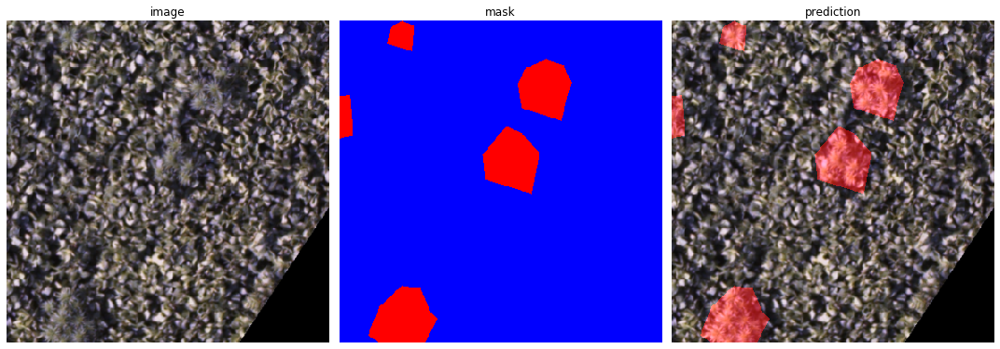

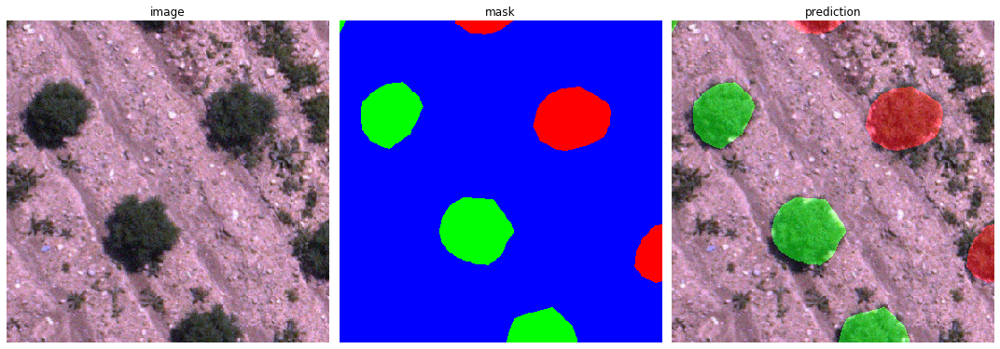

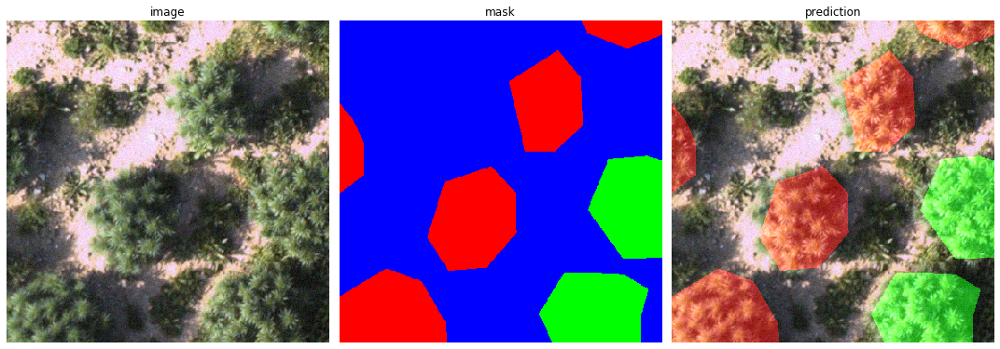

In [11]:
show(train_set, rows=3)

### Show random Samples from validation set:

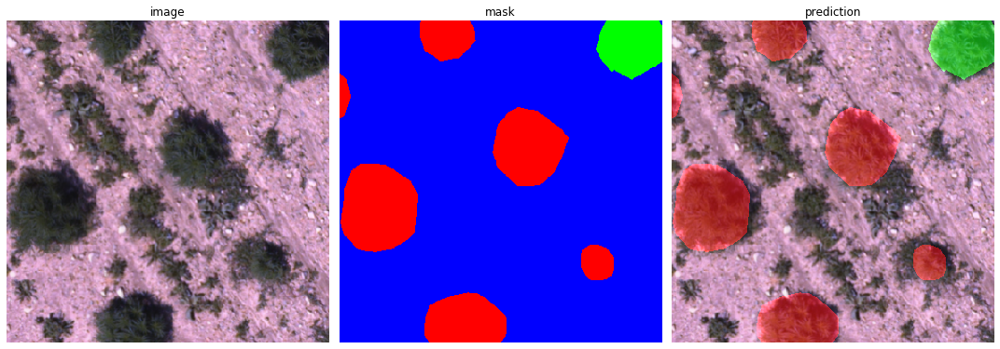

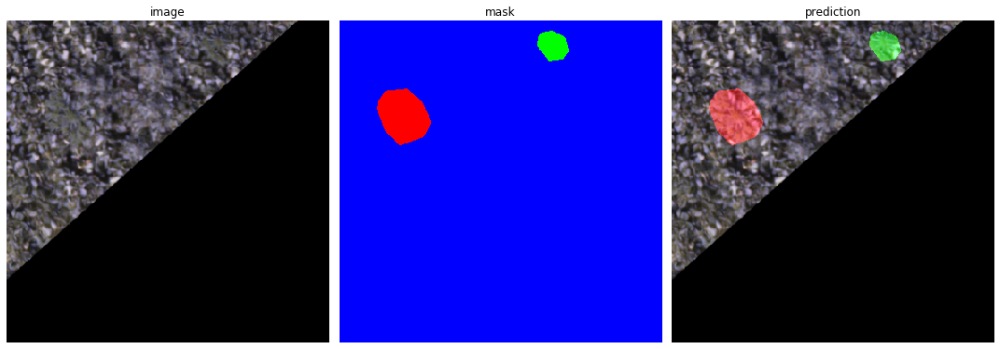

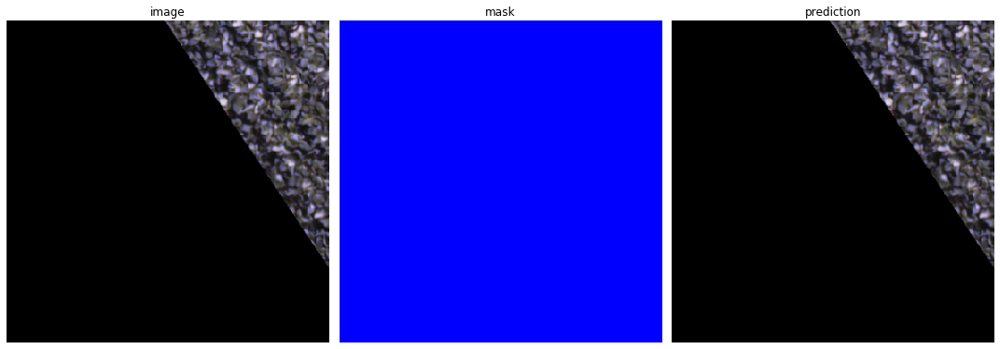

In [12]:
show(val_set, rows=3)

# Model Training

## Create Model with tensorflow.keras:
https://www.tensorflow.org/api_docs/python/tf/keras/  
U-Net based Model with pretrained ResNet-50 Backend  
https://www.tensorflow.org/api_docs/python/tf/keras/applications/ResNet50

In [12]:
BACKBONE_NAME = 'resnet50'
model = segmentation_model_func(3, BACKBONE_NAME, True)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 384, 384, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 390, 390, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 192, 192, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 192, 192, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [15]:
model.compile(optimizer=tf.keras.optimizers.Adam(), loss=dice_cce, metrics=[my_dice_metric_hemp, my_dice_metric_all])

## Visualize Model

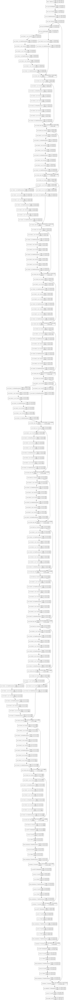

In [16]:
tf.keras.utils.plot_model(model, show_shapes=True)

## Show Sample Prediction with untrained Model:

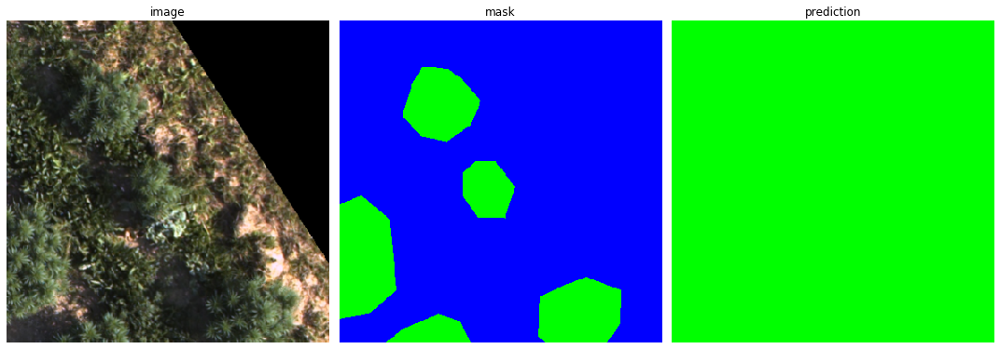

In [17]:
show(val_set, model, 1)

## Define tensorflow.keras training Callbacks
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks

In [18]:
lr_schedule = StepDecay(initAlpha=0.0002, factor=0.3, dropEvery=20)
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('../notebooks/models/best_' + BACKBONE_NAME + '.h5',monitor='val_my_dice_metric_hemp', 
                                   mode = 'max', save_best_only=True, verbose=1)

In [19]:
EPOCHS = 100

model_history = model.fit(train_set.map(unindex).shuffle(512, reshuffle_each_iteration=True).repeat(), epochs=EPOCHS,
                          steps_per_epoch=(len(train_list)//BATCH_SIZE),
                          validation_steps=None,
                          validation_data=val_set.map(unindex),
                          callbacks=[tf.keras.callbacks.LearningRateScheduler(lr_schedule), model_checkpoint])

Train for 43 steps, validate for 11 steps
 Learning Rate: 0.0002
Epoch 1/100
42/43 [============================>.] - ETA: 1s - loss: 0.8769 - my_dice_metric_hemp: 0.4006 - my_dice_metric_all: 0.8364
Epoch 00001: val_my_dice_metric_hemp improved from -inf to 0.04201, saving model to ../notebooks/models/best_resnet50.h5
43/43 [==============================] - 52s 1s/step - loss: 0.8743 - my_dice_metric_hemp: 0.4048 - my_dice_metric_all: 0.8369 - val_loss: 1.1808 - val_my_dice_metric_hemp: 0.0420 - val_my_dice_metric_all: 0.7989
 Learning Rate: 0.0002
Epoch 2/100
42/43 [============================>.] - ETA: 0s - loss: 0.6830 - my_dice_metric_hemp: 0.5546 - my_dice_metric_all: 0.9078
Epoch 00002: val_my_dice_metric_hemp improved from 0.04201 to 0.13943, saving model to ../notebooks/models/best_resnet50.h5
43/43 [==============================] - 35s 823ms/step - loss: 0.6838 - my_dice_metric_hemp: 0.5538 - my_dice_metric_all: 0.9074 - val_loss: 1.7779 - val_my_dice_metric_hemp: 0.1394 -

42/43 [============================>.] - ETA: 0s - loss: 0.4882 - my_dice_metric_hemp: 0.7661 - my_dice_metric_all: 0.9598
Epoch 00036: val_my_dice_metric_hemp improved from 0.72693 to 0.73912, saving model to ../notebooks/models/best_resnet50.h5
43/43 [==============================] - 35s 821ms/step - loss: 0.4893 - my_dice_metric_hemp: 0.7662 - my_dice_metric_all: 0.9597 - val_loss: 0.4868 - val_my_dice_metric_hemp: 0.7391 - val_my_dice_metric_all: 0.9674
 Learning Rate: 6e-05
Epoch 37/100
42/43 [============================>.] - ETA: 0s - loss: 0.4811 - my_dice_metric_hemp: 0.7884 - my_dice_metric_all: 0.9600
Epoch 00037: val_my_dice_metric_hemp did not improve from 0.73912
43/43 [==============================] - 33s 765ms/step - loss: 0.4818 - my_dice_metric_hemp: 0.7866 - my_dice_metric_all: 0.9600 - val_loss: 0.5367 - val_my_dice_metric_hemp: 0.6595 - val_my_dice_metric_all: 0.9595
 Learning Rate: 6e-05
Epoch 38/100
42/43 [============================>.] - ETA: 0s - loss: 0.531

 Learning Rate: 5.399999999999999e-06
Epoch 72/100
42/43 [============================>.] - ETA: 0s - loss: 0.4637 - my_dice_metric_hemp: 0.8097 - my_dice_metric_all: 0.9636
Epoch 00072: val_my_dice_metric_hemp did not improve from 0.75583
43/43 [==============================] - 33s 773ms/step - loss: 0.4630 - my_dice_metric_hemp: 0.8114 - my_dice_metric_all: 0.9639 - val_loss: 0.4792 - val_my_dice_metric_hemp: 0.7491 - val_my_dice_metric_all: 0.9681
 Learning Rate: 5.399999999999999e-06
Epoch 73/100
42/43 [============================>.] - ETA: 0s - loss: 0.4795 - my_dice_metric_hemp: 0.8184 - my_dice_metric_all: 0.9612
Epoch 00073: val_my_dice_metric_hemp did not improve from 0.75583
43/43 [==============================] - 32s 749ms/step - loss: 0.4780 - my_dice_metric_hemp: 0.8204 - my_dice_metric_all: 0.9615 - val_loss: 0.4818 - val_my_dice_metric_hemp: 0.7445 - val_my_dice_metric_all: 0.9679
 Learning Rate: 5.399999999999999e-06
Epoch 74/100
42/43 [============================>.

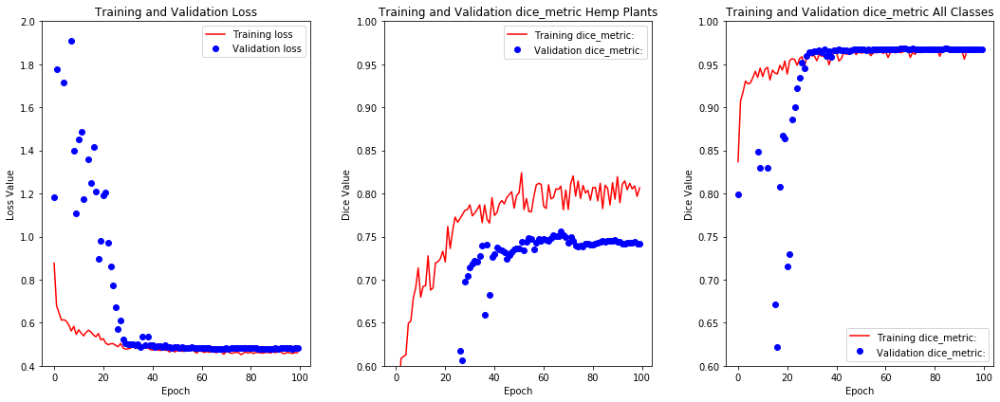

In [20]:
epochs = range(EPOCHS)
fig, ax = plt.subplots(1, 3, figsize=(15, 6))

ax[0].plot(epochs, model_history.history['loss'], 'r', label='Training loss')
ax[0].plot(epochs, model_history.history['val_loss'], 'bo', label='Validation loss')
ax[0].set_title('Training and Validation Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss Value')
ax[0].set_ylim([0.4, 2.])
ax[0].legend()
ax[1].plot(epochs, model_history.history['my_dice_metric_hemp'], 'r', label='Training dice_metric:')
ax[1].plot(epochs, model_history.history['val_my_dice_metric_hemp'], 'bo', label='Validation dice_metric:')
ax[1].set_title('Training and Validation dice_metric Hemp Plants')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Dice Value')
ax[1].set_ylim([0.6, 1.])
ax[1].legend()
ax[2].plot(epochs, model_history.history['my_dice_metric_all'], 'r', label='Training dice_metric:')
ax[2].plot(epochs, model_history.history['val_my_dice_metric_all'], 'bo', label='Validation dice_metric:')
ax[2].set_title('Training and Validation dice_metric All Classes')
ax[2].set_xlabel('Epoch')
ax[2].set_ylabel('Dice Value')
ax[2].set_ylim([0.6, 1.])
ax[2].legend()

plt.tight_layout()

In [11]:
model = tf.keras.models.load_model('../notebooks/models/best6_resnet50.h5', custom_objects={'dice_cce': dice_cce, 'my_dice_metric_hemp': my_dice_metric_hemp, 'my_dice_metric_all': my_dice_metric_all})

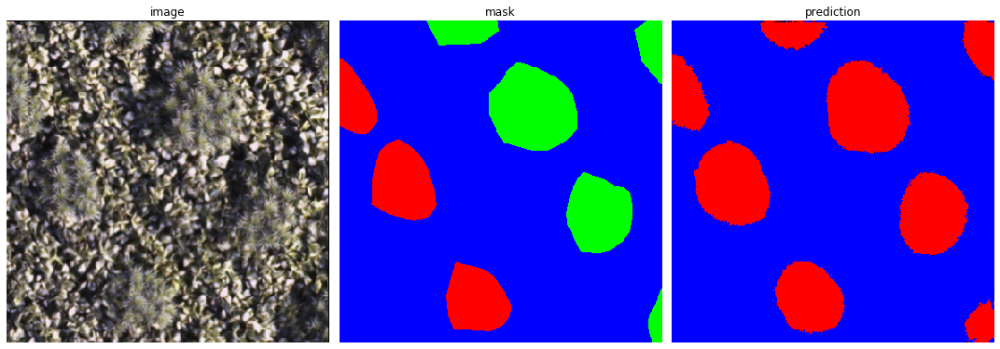

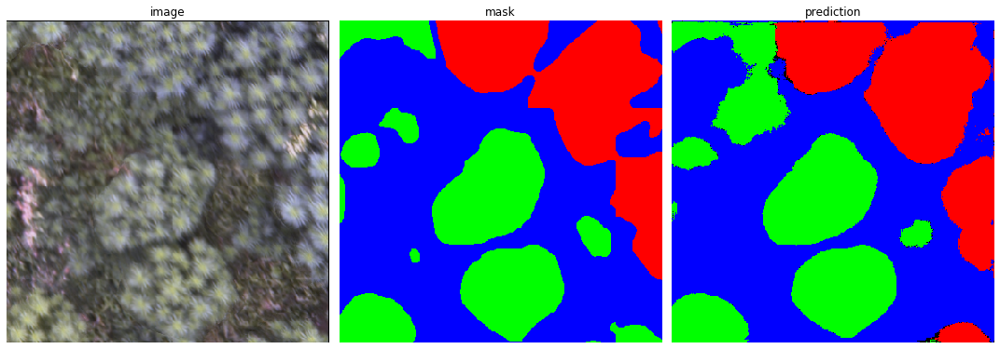

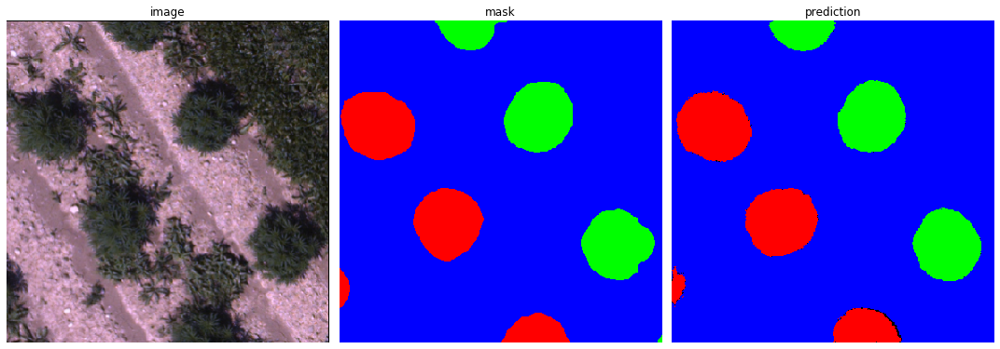

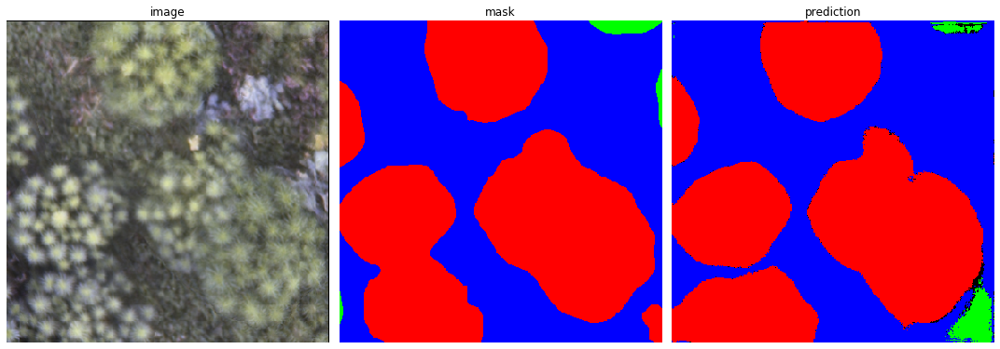

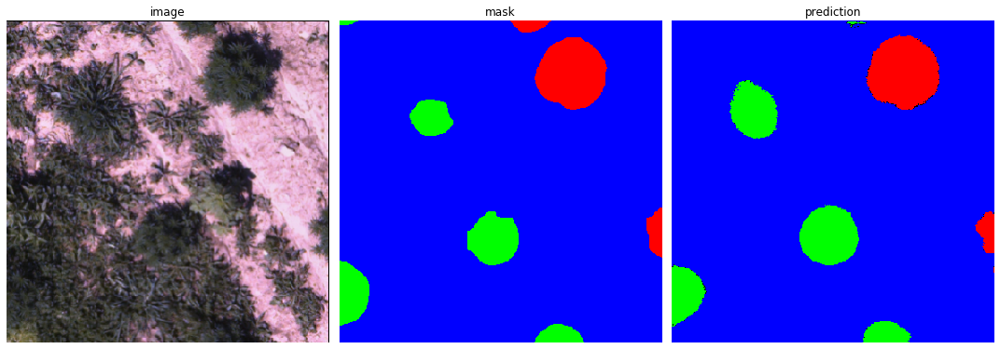

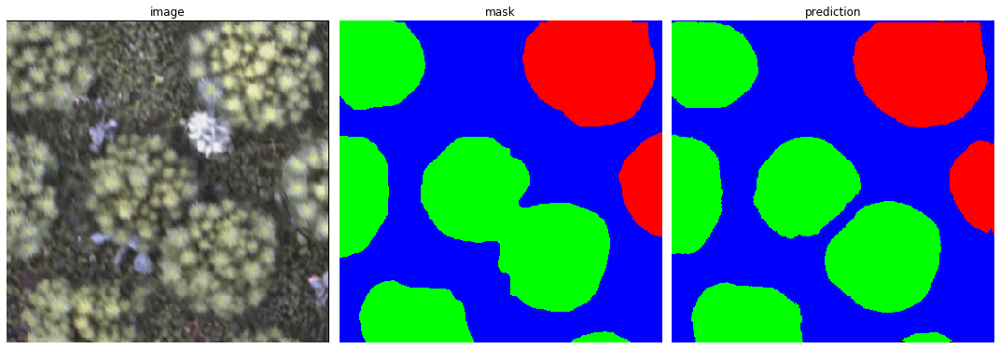

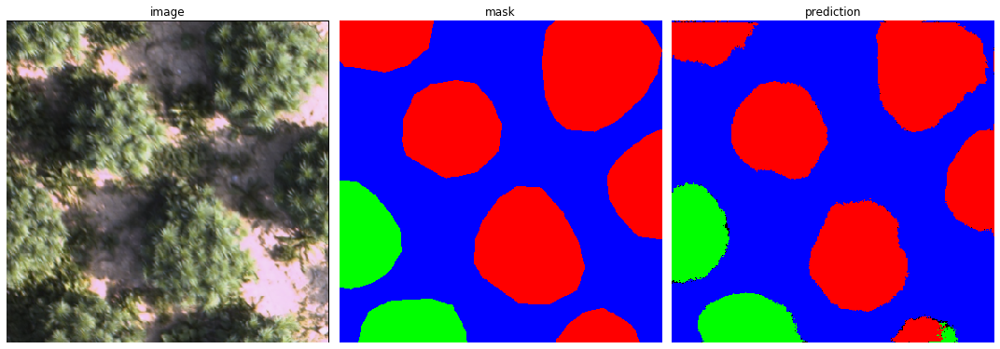

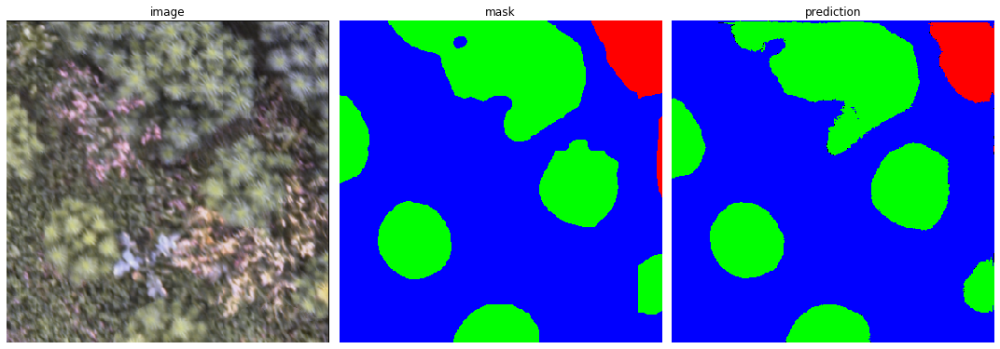

In [21]:
show(test_set, model, 8)

# Layer Visualisation

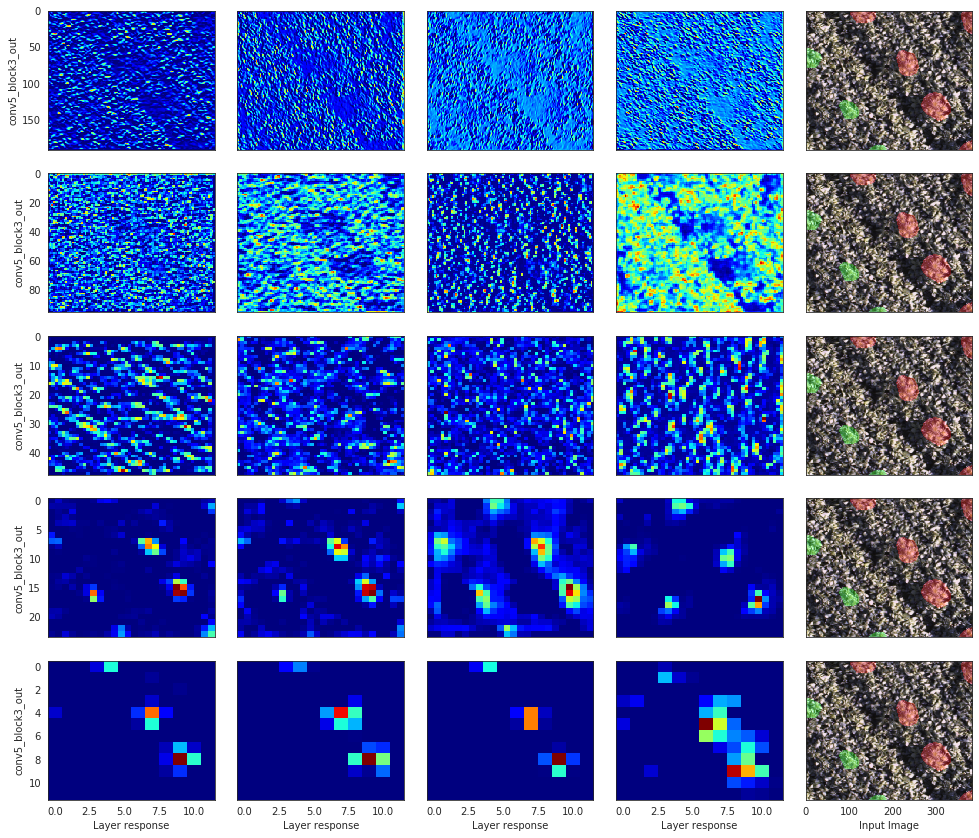

In [20]:
sns.set_style("white")

input_img = imread("../data/sliced/test_a/images/20190719_x1005_y1013.png")
input_msk = imread("../data/sliced/test_a/masks/20190719_x1005_y1013.png")

visualize_layers(input_img, input_msk, model, [
        'conv1_relu',
        'conv2_block3_out',
        'conv3_block4_out',
        'conv4_block6_out',
        'conv5_block3_out'], shift=4)

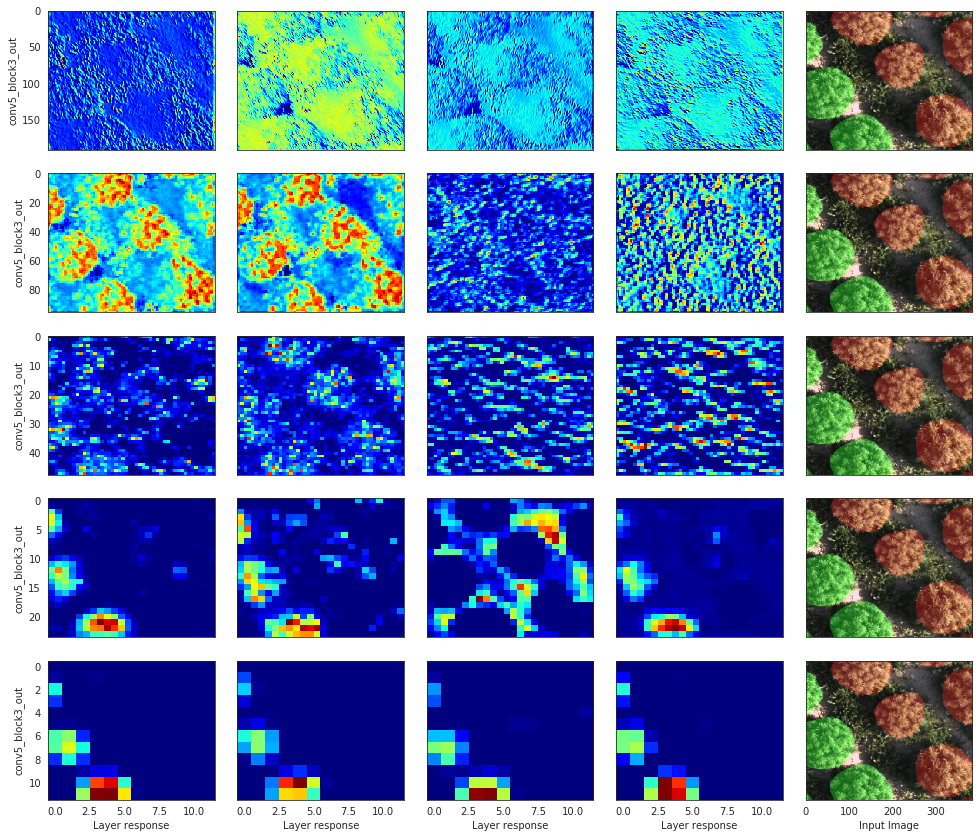

In [21]:
sns.set_style("white")

input_img = imread("../data/sliced/test_a/images/20190719_x1015_y1012.png")
input_msk = imread("../data/sliced/test_a/masks/20190719_x1015_y1012.png")

visualize_layers(input_img, input_msk, model, [
        'conv1_relu',
        'conv2_block3_out',
        'conv3_block4_out',
        'conv4_block6_out',
        'conv5_block3_out'], shift=4)

# Evaluation

## Calculate optimal prediction threshold:
In order to create Binary Prediction Maps to measure accuracy a threshold to the class probability maps has to applied. The optimal threshold to apply can be can be empirically calculated by looping over the validation set and calculate accuracy on different threshold levels

In [12]:
sev = Segmentation_Evaluation(model)

In [13]:
preds_all = []
msks_all = []

for batch in val_set:
    images, masks = batch[0].numpy(), batch[1].numpy()
    predictions = model.predict(images)
    for msk, pred in zip(masks, predictions):
        msks_all.append(msk.astype('float32'))
        preds_all.append(pred.astype('float32'))
        
msks_all = np.asarray(msks_all)
preds_all = np.asarray(preds_all)

In [14]:
def dice_metric_batch(y_true_in, y_pred_in):
    y_true_in = y_true_in[:, :, :, 0:2].copy()
    y_pred_in = y_pred_in[:, :, :, 0:2].copy()
    batch_size = y_true_in.shape[0]
    metric = []
    for batch in range(batch_size):
        value = sev.dice_score(y_true_in[batch], y_pred_in[batch])
        metric.append(value)
    return np.nanmean(metric)

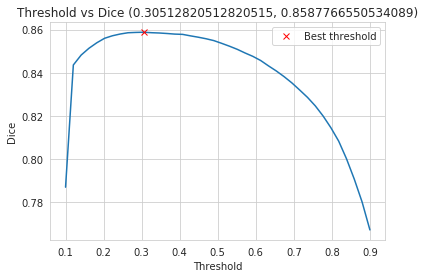

In [15]:
## Scoring for different thresholds, choose threshold by validation data 
thresholds_ori = np.linspace(0.1, 0.9, 40)
dices = np.array([dice_metric_batch(msks_all, preds_all > threshold) for threshold in thresholds_ori])

threshold_best_index = np.argmax(dices) 
dice_best = dices[threshold_best_index]
BEST_THRESHOLD = thresholds_ori[threshold_best_index]

sns.set_style("whitegrid")
plt.plot(thresholds_ori, dices)
plt.plot(BEST_THRESHOLD, dice_best, "xr", label="Best threshold")
plt.xlabel("Threshold")
plt.ylabel("Dice")
plt.title("Threshold vs Dice ({}, {})".format(BEST_THRESHOLD, dice_best))
plt.legend()

## Calculate Error Map

In [16]:
errors_1001 = np.zeros((384, 384))
errors_1005 = np.zeros((384, 384))

for batch in test_set:
    images, masks = batch[0].numpy(), batch[1].numpy()
    predictions = model.predict(images) > BEST_THRESHOLD
    for msk, pred in zip(masks, predictions):
        errors_1001 += (msk[:, :, 0] != pred[:, :, 0]).astype(float)
        errors_1005 += (msk[:, :, 1] != pred[:, :, 1]).astype(float)

errors_1001 /= errors_1001.max()
errors_1005 /= errors_1005.max()

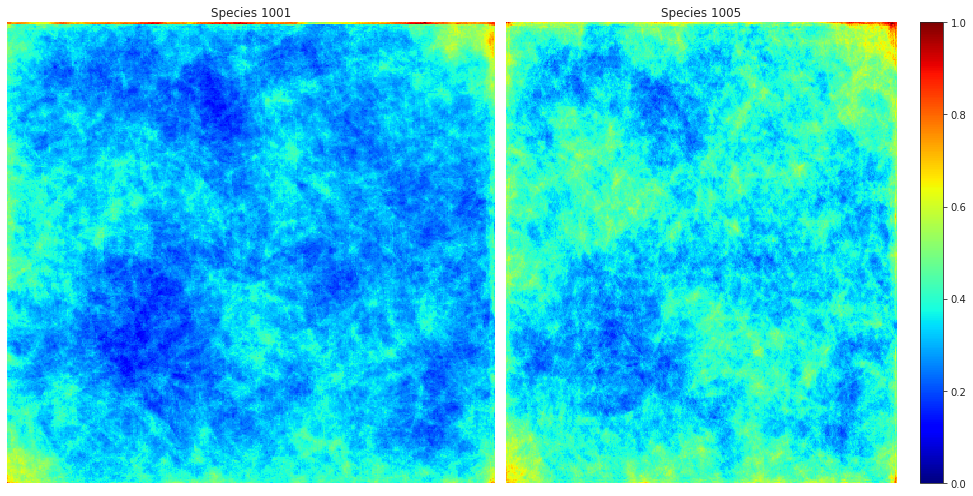

In [49]:
sns.set_style("white")
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)
plt.imshow(errors_1001, vmin=0.0, vmax=1.0, cmap='jet', aspect='auto')
plt.axis('off')
plt.title("Species 1001")
plt.subplot(1, 2, 2)
plt.imshow(errors_1005, vmin=0.0, vmax=1.0, cmap='jet', aspect='auto')
plt.title("Species 1005")
plt.axis('off')
plt.colorbar()
plt.tight_layout()

In [118]:
sev = Segmentation_Evaluation(model, BEST_THRESHOLD)

In [ ]:
sev.create_prediction_map(di_test_A, 0, apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_A, 0, apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_A, 0, apply_majority_vote=True, overlap=64)

In [ ]:
sev.create_prediction_map(di_test_A, 1, apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_A, 1, apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_A, 1, apply_majority_vote=True, overlap=64)

In [ ]:
sev.create_prediction_map(di_test_A, 2, apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_A, 2, apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_A, 2, apply_majority_vote=True, overlap=64)

In [120]:
sev.create_prediction_map(di_train, 0, apply_majority_vote=True, overlap=64)
sev.create_prediction_map(di_train, 1, apply_majority_vote=True, overlap=64)
sev.create_prediction_map(di_train, 2, apply_majority_vote=True, overlap=64)

Processed 5 rows of 24
Processed 10 rows of 24
Processed 15 rows of 24
Processed 20 rows of 24
Processed 5 rows of 27
Processed 10 rows of 27
Processed 15 rows of 27
Processed 20 rows of 27
Processed 25 rows of 27
Processed 5 rows of 29
Processed 10 rows of 29
Processed 15 rows of 29
Processed 20 rows of 29
Processed 25 rows of 29


In [22]:
import rasterio as rio
from rasterio.plot import show
import cv2

In [23]:
import warnings
warnings.filterwarnings("ignore")

In [54]:
from skimage.transform import rescale, resize

def overlay_mask(img, mask, alpha=0.6):
    mask[:, :, 2] = 0
    out_img = cv2.add(img.astype(float), np.multiply(mask, alpha).astype(float))
    return np.clip(out_img, 0, 1)

def raster_gt(box, gt):
    transform = rio.transform.from_bounds(*box.geometry.values[0].bounds,768, 768)
    species_encoding = {1001 : 1, 1005 : 2}
    inter = gpd.overlay(gt, box, how='intersection')
    shapes = ((row.geometry, species_encoding[row.Species]) for _, row in inter.iterrows())
    rastered_shape = rio.features.rasterize(shapes=shapes,
                                            out_shape=(768, 768),
                                            transform=transform)
    rgb_mask = np.zeros((768, 768, 3))
    rgb_mask[:, :, 0] = rastered_shape == 1
    rgb_mask[:, :, 1] = rastered_shape == 2
    return rgb_mask
    
def display_samples(raster, prediction, grid, gt):
    fig, ax = plt.subplots(2, 6, figsize=(16, 6))
    props = dict(boxstyle='round', facecolor='white', alpha=1.0)
    labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)']
    i = 0
    for y  in range(2):
        for x in range(0, 6, 2):
            box = [feature.geometry for _, feature in grid.iloc[[i]].iterrows()]

            img, _ = rio.mask.mask(raster, box, crop=True)
            img = np.moveaxis(img, 0, -1)[:, :, 0:3]
            
            img = resize(img, (768, 768))

            pred, _ = rio.mask.mask(prediction, box, crop=True)
            pred = np.moveaxis(pred, 0, -1)
            
            pred = resize(pred, (768, 768))

            pred = overlay_mask(img, pred)
            
            rastered_gt = raster_gt(grid.iloc[[i]], gt)
            rastered_gt = overlay_mask(img, rastered_gt)
            
            ax[y, x].imshow(pred)
            ax[y, x+1].imshow(rastered_gt)
            ax[y, x].axis('off')
            ax[y, x+1].axis('off')
            ax[y, x].text(20, 20, "(" + grid.iloc[[i]].label.values[0] + ")", fontsize=20, verticalalignment='top', bbox=props)
            i += 1
    ax[0, 0].set_title("Prediction", fontsize=20)
    ax[0, 1].set_title("Ground Truth", fontsize=20)
    ax[0, 2].set_title("Prediction", fontsize=20)
    ax[0, 3].set_title("Ground Truth", fontsize=20)
    ax[0, 4].set_title("Prediction", fontsize=20)
    ax[0, 5].set_title("Ground Truth", fontsize=20)

    plt.tight_layout()

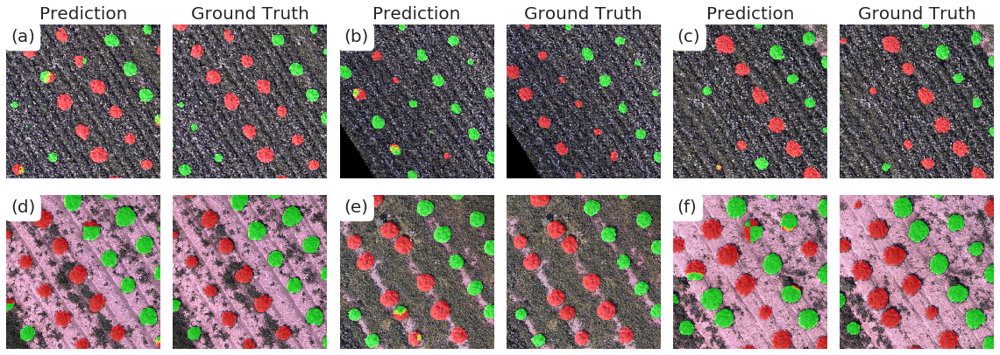

In [55]:
raster = rio.open("../data/rasters/20190703/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190703_rgb_A_mv_False_overlap_0.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190703Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

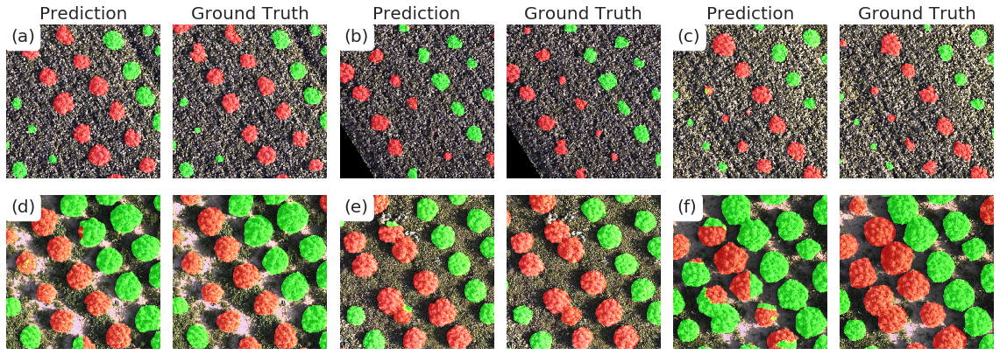

In [56]:
raster = rio.open("../data/rasters/20190719/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190719_rgb_A_mv_False_overlap_0.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190719Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

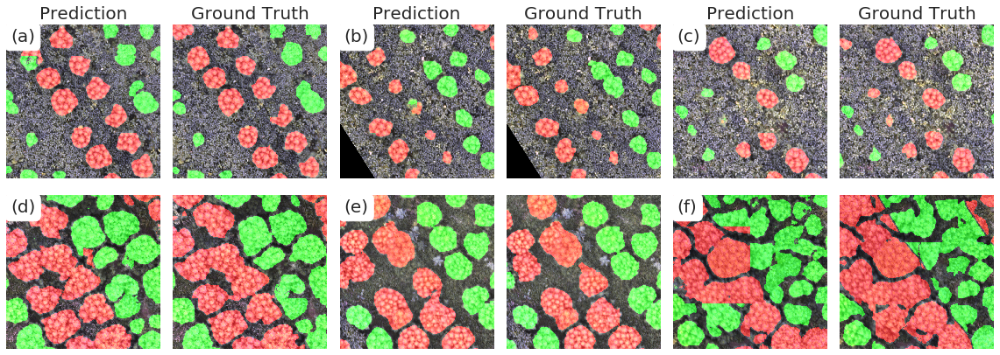

In [57]:
raster = rio.open("../data/rasters/20190822/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190822_rgb_A_mv_False_overlap_0.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190822Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

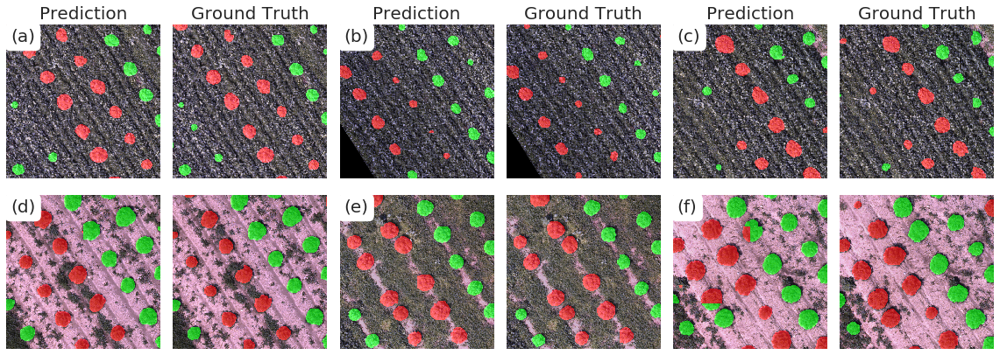

In [58]:
raster = rio.open("../data/rasters/20190703/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_0.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190703Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

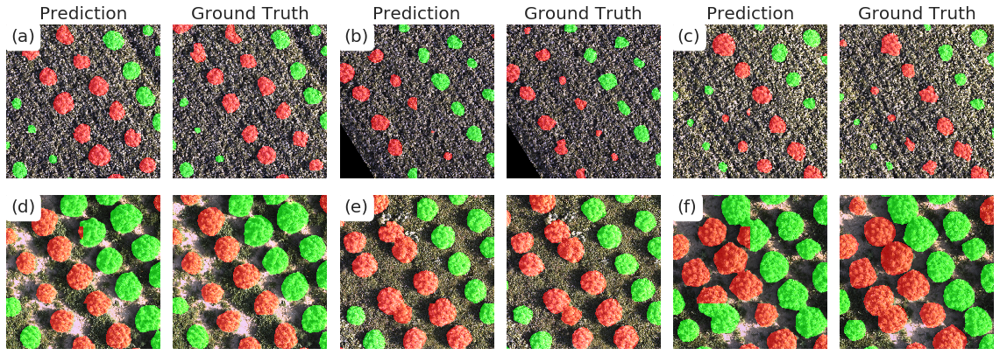

In [59]:
raster = rio.open("../data/rasters/20190719/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_0.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190719Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

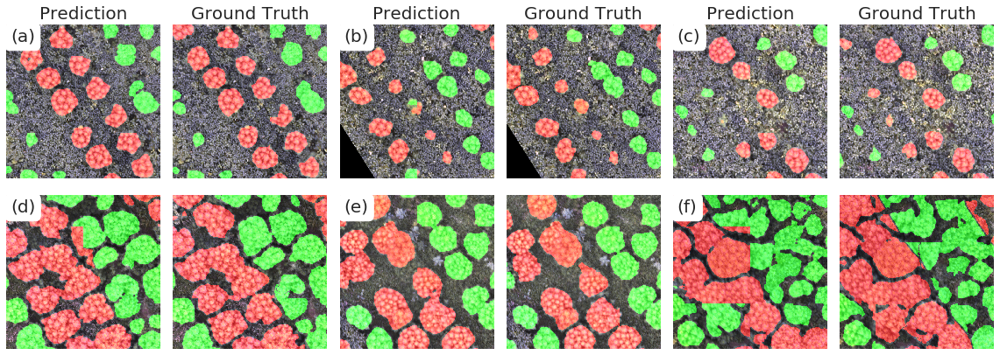

In [60]:
raster = rio.open("../data/rasters/20190822/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190822_rgb_A_mv_True_overlap_0.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190822Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

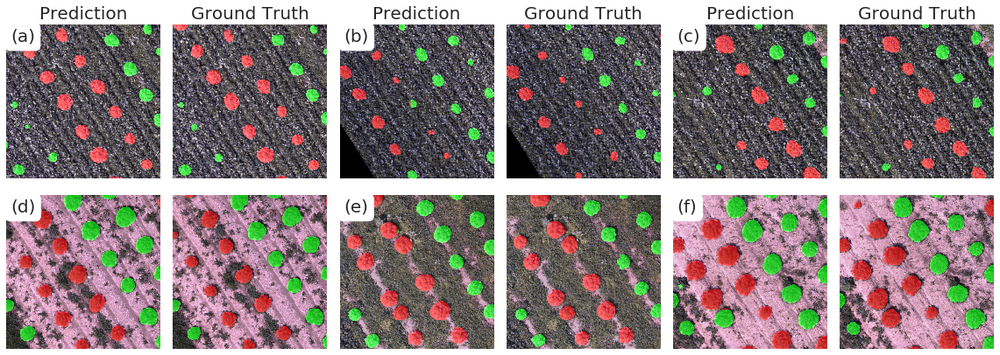

In [61]:
raster = rio.open("../data/rasters/20190703/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_64.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190703Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

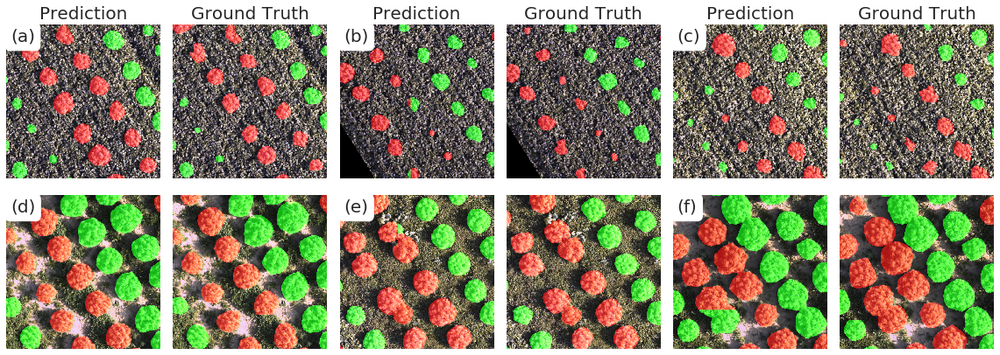

In [62]:
raster = rio.open("../data/rasters/20190719/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_64.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190719Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

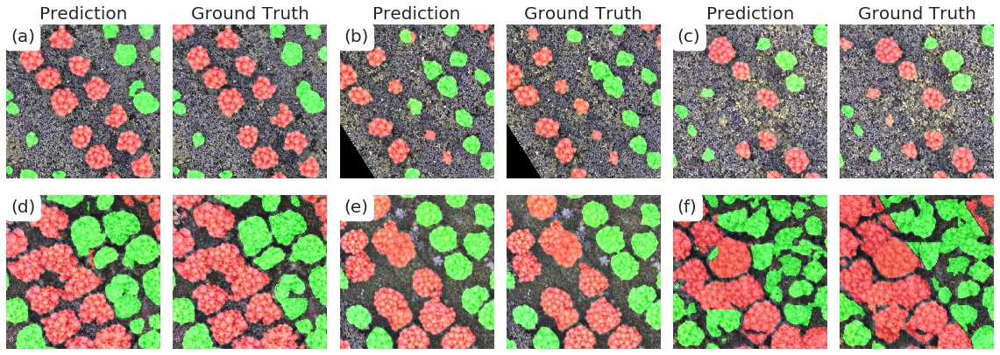

In [63]:
raster = rio.open("../data/rasters/20190822/rgb.tif")
prediction = rio.open("../data/exports/prediction_20190822_rgb_A_mv_True_overlap_64.tif")
grid = gpd.read_file('../data/exports/grid6.shp')
gt = Plant_Masks['20190822Field_A']
display_samples(raster, prediction, grid.iloc[::-1], gt)

## Calculate Dice Coefficients:

In [64]:
idx_val = [s[-15:-4] for s in val_list_images]
idx_test = [s[-15:-4] for s in test_list_images]

In [65]:
sev = Segmentation_Evaluation(model, BEST_THRESHOLD)

### Vanilla Model:

In [66]:
scores_val_vanilla = sev.evaluate_on_set(val_set, idx_val, apply_majority_vote=False, center_crop=False)
scores_test_vanilla = sev.evaluate_on_set(test_set, idx_test, apply_majority_vote=False, center_crop=False)

In [67]:
print_results(scores_val_vanilla, scores_test_vanilla, scores_val_vanilla, scores_test_vanilla)

+----------+-----------------+------------------+-----------+-------------------+
|   Date   | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+----------+-----------------+------------------+-----------+-------------------+
| 20190703 |      85.88      |       0.00       |   77.83   |        0.00       |
| 20190719 |      87.90      |       0.00       |   79.53   |        0.00       |
| 20190822 |      90.64      |       0.00       |   83.69   |        0.00       |
+----------+-----------------+------------------+-----------+-------------------+


In [38]:
print_results(scores_val_vanilla, scores_test_vanilla, scores_val_vanilla, scores_test_vanilla)

+----------+-----------------+------------------+-----------+-------------------+
|   Date   | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+----------+-----------------+------------------+-----------+-------------------+
| 20190703 |      83.65      |       0.00       |   77.98   |        0.00       |
| 20190719 |      87.27      |       0.00       |   79.60   |        0.00       |
| 20190822 |      90.60      |       0.00       |   83.55   |        0.00       |
+----------+-----------------+------------------+-----------+-------------------+


### Majority Vote:

In [39]:
scores_val_majority = sev.evaluate_on_set(val_set, idx_val, apply_majority_vote=True, center_crop=False)
scores_test_majority = sev.evaluate_on_set(test_set, idx_test, apply_majority_vote=True, center_crop=False)

In [40]:
print_results(scores_val_vanilla, scores_test_vanilla, scores_val_majority, scores_test_majority)

+----------+-----------------+------------------+-----------+-------------------+
|   Date   | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+----------+-----------------+------------------+-----------+-------------------+
| 20190703 |      85.09      |       1.44       |   81.59   |        3.60       |
| 20190719 |      87.52      |       0.25       |   81.85   |        2.25       |
| 20190822 |      90.15      |      -0.44       |   85.11   |        1.56       |
+----------+-----------------+------------------+-----------+-------------------+


### Center Crop:

In [41]:
scores_val_center = sev.evaluate_on_set(val_set, idx_val, apply_majority_vote=True, center_crop=True)
scores_test_center = sev.evaluate_on_set(test_set, idx_test, apply_majority_vote=True, center_crop=True)

In [42]:
print_results(scores_val_majority, scores_test_majority, scores_val_center, scores_test_center)

+----------+-----------------+------------------+-----------+-------------------+
|   Date   | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+----------+-----------------+------------------+-----------+-------------------+
| 20190703 |      86.26      |       1.17       |   82.83   |        1.24       |
| 20190719 |      89.87      |       2.35       |   82.99   |        1.15       |
| 20190822 |      91.02      |       0.87       |   86.22   |        1.11       |
+----------+-----------------+------------------+-----------+-------------------+


# Count Plants

In [17]:
prediction_0703 = rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_64.tif")
prediction_0719 = rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_64.tif")

In [18]:
from skimage.measure import label, regionprops, regionprops_table

In [19]:
from rasterio.features import shapes
image_1001 = prediction_0703.read(1)
image_1005 = prediction_0703.read(2)
results_1001 = (
{'properties': {'raster_val': v}, 'geometry': s}
for i, (s, v) in enumerate(shapes(image_1001, mask=None, transform=prediction_0703.transform)))
results_1005 = (
{'properties': {'raster_val': v}, 'geometry': s}
for i, (s, v) in enumerate(shapes(image_1005, mask=None, transform=prediction_0703.transform)))

geoms_1001 = list(results_1001)
geoms_1005 = list(results_1005)

gpd_polygonized_raster_1001  = gpd.GeoDataFrame.from_features(geoms_1001)
gpd_polygonized_raster_1005  = gpd.GeoDataFrame.from_features(geoms_1005)
gpd_polygonized_raster_1001['Species'] = 1001
gpd_polygonized_raster_1005['Species'] = 1005
df_prediction_0703_A = pd.concat([gpd_polygonized_raster_1001, gpd_polygonized_raster_1005])

In [20]:
def calculate_accuracy(df_prediction, df_ground_truth):
    TP = np.zeros((len(df_prediction), 1))
    TN = np.zeros((len(df_prediction), 1))
    FN = np.ones((len(df_prediction), 1))
    FP = np.ones((len(df_ground_truth), 1))

    radius = 0.3

    for i, p_pred in enumerate(df_prediction['geometry'].centroid.values):
        for j, p_gt in enumerate(df_ground_truth['geometry'].centroid.values):
            distance = p_pred.distance(p_gt)
            if distance < radius:
                TP[i] = 1
                TN[i] = 1
                FP[j] = 0

    FN = FN - TP
    
    precision = np.sum(TP)/(np.sum(TP)+np.sum(FP))
    recall = np.sum(TP)/(np.sum(TP)+np.sum(FN))
    TNR = np.sum(TN)/(np.sum(TN)+np.sum(FP))
    TPR = recall
    accuracy = (TPR + TNR) / 2
    
    n_pred = len(df_prediction)
    n_gt = len(df_ground_truth)
    
    return precision, recall, accuracy, n_pred, n_gt

In [21]:
calculate_accuracy(df_prediction_0703_A[df_prediction_0703_A['Species'] == 1001], Plant_Masks['20190703Field_A'][Plant_Masks['20190703Field_A']['Species'] == 1001])

(0.9052631578947369, 0.8989547038327527, 0.9021089308637448, 574, 569)

In [174]:
calculate_accuracy(df_prediction_0703_A[df_prediction_0703_A['Species'] == 1005], Plant_Masks['20190703Field_A'][Plant_Masks['20190703Field_A']['Species'] == 1005])

(0.8910034602076125, 0.8848797250859106, 0.8879415926467615, 582, 579)

In [22]:
for key, value in zip(Seed_Masks.keys(), Seed_Masks.values()):
    intersection_gt_1001 = gpd.overlay(Plant_Masks['20190703Field_A'][Plant_Masks['20190703Field_A']['Species'] == 1001], value, how='intersection')
    intersection_pred_1001 = gpd.overlay(df_prediction_0703_A[df_prediction_0703_A['Species'] == 1001], value, how='intersection')
    
    intersection_gt_1005 = gpd.overlay(Plant_Masks['20190703Field_A'][Plant_Masks['20190703Field_A']['Species'] == 1005], value, how='intersection')
    intersection_pred_1005 = gpd.overlay(df_prediction_0703_A[df_prediction_0703_A['Species'] == 1005], value, how='intersection')
    
    print(key)
    print(calculate_accuracy(intersection_pred_1001, intersection_gt_1001))
    print(calculate_accuracy(intersection_pred_1005, intersection_gt_1005))
    print("----")

C_1
(0.8115942028985508, 0.9491525423728814, 0.8803733726357161, 59, 70)
(nan, 0.0, nan, 14, 0)
----
C_2
(nan, 0.0, nan, 3, 0)
(0.922077922077922, 0.9726027397260274, 0.9473403309019748, 73, 77)
----
C_3
(0.9523809523809523, 0.9876543209876543, 0.9700176366843033, 81, 84)
(nan, 0.0, nan, 5, 0)
----
C_4
(0.8333333333333334, 0.5555555555555556, 0.6944444444444444, 9, 6)
(0.948051948051948, 0.948051948051948, 0.948051948051948, 77, 77)
----
C_5
(0.9642857142857143, 0.9, 0.9321428571428572, 90, 82)
(0.0, 0.0, 0.0, 5, 2)
----
C_6
(1.0, 0.05, 0.525, 40, 2)
(0.627906976744186, 0.9642857142857143, 0.7960963455149501, 56, 85)
----
C_7
(0.9883720930232558, 0.9770114942528736, 0.9826917936380647, 87, 86)
(nan, 0.0, nan, 4, 0)
----
C_8
(1.0, 0.125, 0.5625, 8, 1)
(0.9418604651162791, 0.9642857142857143, 0.9530730897009967, 84, 88)
----
C_9
(1.0, 0.9651162790697675, 0.9825581395348837, 86, 83)
(nan, 0.0, nan, 4, 0)
----
C_10
(nan, 0.0, nan, 3, 0)
(0.9529411764705882, 0.9759036144578314, 0.9644223954